In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv('mnist_train.csv')
df.head()

,5,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,...,0.608,0.609,0.610,0.611,0.612,0.613,0.614,0.615,0.616,0.617
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(59999, 785)

In [4]:
df.sample()

,5,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,...,0.608,0.609,0.610,0.611,0.612,0.613,0.614,0.615,0.616,0.617
52894,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


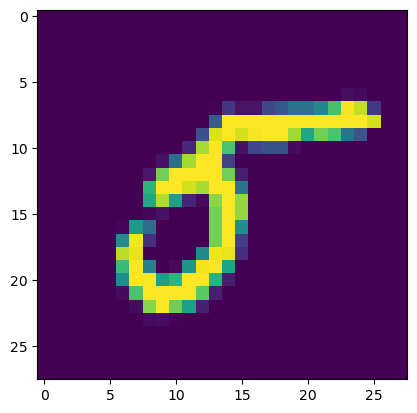

In [5]:
plt.imshow(df.iloc[54778,1:].values.reshape(28,28))

In [6]:
df.sample()

,5,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,...,0.608,0.609,0.610,0.611,0.612,0.613,0.614,0.615,0.616,0.617
6439,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


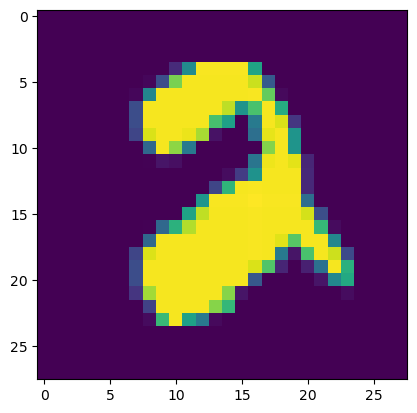

In [7]:
plt.imshow(df.iloc[26010, 1:].values.reshape(28,28))

In [8]:
X = df.iloc[:, 1:]
y = df.iloc[:, 0]

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

In [10]:
X_train.shape

(47999, 784)

In [11]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [12]:
import time

start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

29.115864992141724


In [13]:
accuracy_score(y_test, y_pred)

0.9686666666666667

# MNIST Using PCA

In [14]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#### I have to define n_component here if i will not define it will create component according to our column here i we have 784 columns so it will create 784 n_component

In [15]:
pca = PCA(n_components = None)

X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [16]:
X_train_trf.shape

(47999, 784)

In [17]:
knn = KNeighborsClassifier()

knn.fit(X_train_trf, y_train)

KNeighborsClassifier()

In [18]:
import time

start = time.time()

y_pred = knn.predict(X_test_trf)

print(time.time() - start)

C:\Users\Om\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\Om\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\Users\Om\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Om\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

17.847829818725586


In [19]:
accuracy_score(y_pred, y_test)

0.9425833333333333

In [20]:
pca = PCA(n_components = 100)

X_train_trf1 = pca.fit_transform(X_train)
X_test_trf1 = pca.transform(X_test)

In [21]:
X_train.shape

(47999, 784)

In [22]:
knn = KNeighborsClassifier()

knn.fit(X_train_trf1, y_train)

KNeighborsClassifier()

In [23]:
import time

start = time.time()

y_pred = knn.predict(X_test_trf1)

print(time.time() - start)

4.655976295471191


In [24]:
accuracy_score(y_pred, y_test)

0.9550833333333333

In [27]:
component = []
accuracy = []

for i in range(1, 100):
    pca = PCA(n_components = i)

    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)

    knn = KNeighborsClassifier()

    knn.fit(X_train_trf, y_train)

    y_pred = knn.predict(X_test_trf)
    acc = accuracy_score(y_pred, y_test)

    print(acc)

    component.append(i)
    accuracy.append(acc)

0.25333333333333335
0.3145
0.50175
0.6581666666666667
0.7324166666666667
0.8229166666666666
0.8373333333333334
0.8683333333333333
0.8826666666666667
0.9049166666666667
0.91275
0.9181666666666667
0.9279166666666666
0.9339166666666666
0.9383333333333334
0.93975
0.942
0.9411666666666667
0.9448333333333333
0.9456666666666667
0.9464166666666667
0.9479166666666666
0.9476666666666667
0.9473333333333334
0.9499166666666666
0.9503333333333334
0.95075
0.95175
0.9516666666666667
0.9530833333333333
0.9538333333333333
0.9546666666666667
0.9545833333333333
0.95425
0.9555
0.9559166666666666
0.9566666666666667
0.9571666666666667
0.9574166666666667
0.9573333333333334
0.9574166666666667
0.95725
0.9576666666666667
0.9573333333333334
0.9571666666666667
0.9575833333333333
0.9574166666666667
0.9584166666666667
0.9578333333333333
0.9574166666666667
0.9578333333333333
0.9569166666666666
0.9566666666666667
0.9566666666666667
0.9566666666666667
0.9571666666666667
0.9568333333333333
0.9564166666666667
0.957
0.956

In [30]:
result = pd.DataFrame({
    'No. Of Component' : component,
    'Accuracy Score' : accuracy
})

In [36]:
result[result['Accuracy Score'] > 0.955]

,No. Of Component,Accuracy Score
34,35,0.955500
35,36,0.955917
36,37,0.956667
37,38,0.957167
38,39,0.957417
...,...,...
94,95,0.955833
95,96,0.956083
96,97,0.955583
97,98,0.955417


### Transforming to a 2D coordinate system

In [38]:
pca = PCA( n_components = 2)
X_train_trf2 = pca.fit_transform(X_train)
X_test_trf2 = pca.transform(X_test)

In [39]:
X_train_trf2

array([[-4.56860172, -3.13654406],
       [-5.43204551,  1.93975271],
       [-3.10851029,  3.56784893],
       ...,
       [-0.6654747 , -8.04278317],
       [ 2.49420841, -5.47057388],
       [-7.6365319 , -1.3397406 ]])

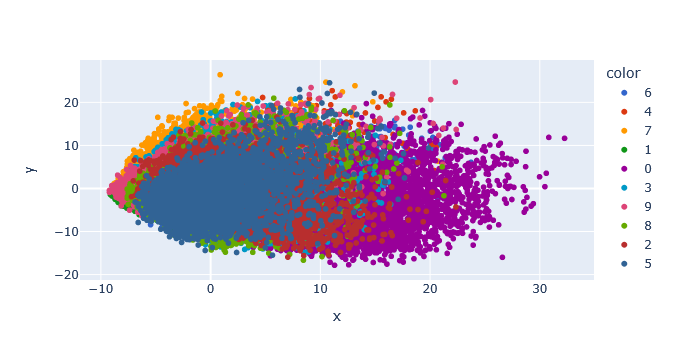

In [42]:
y_train_trf = y_train.astype(str)
fig = px.scatter(x = X_train_trf2[:,0],
                 y = X_train_trf2[:,1],
                color = y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10)

fig.show()

### Transforming to a 2D coordinate system

In [43]:
pca = PCA(n_components = 3)
X_train_trf3 = pca.fit_transform(X_train)
X_test_trf3 = pca.transform(X_test)

In [44]:
X_train_trf3

array([[-4.56860172, -3.13654406,  2.22540586],
       [-5.43204551,  1.93975271, -1.44379945],
       [-3.10851029,  3.56784893, -8.70685443],
       ...,
       [-0.6654747 , -8.04278317,  1.55810163],
       [ 2.49420841, -5.47057388,  2.38782624],
       [-7.6365319 , -1.3397406 ,  3.42157122]])

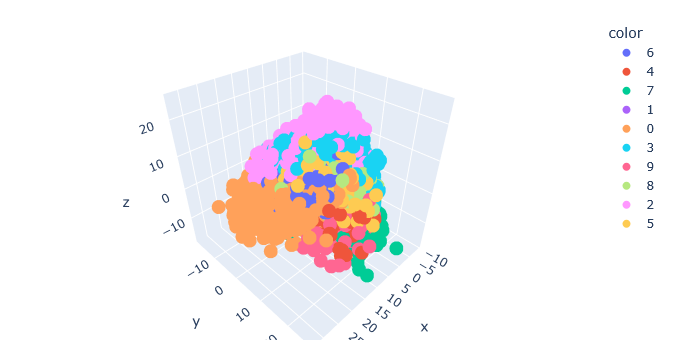

In [47]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df,
                x = X_train_trf3[:,0],
                y = X_train_trf3[:,1],
                z = X_train_trf3[:,2],
                color = y_train_trf)

fig.update_layout(margin = dict(l=20, r=20, t=20, b=20))

fig.show()

### Eigen values

In [48]:
pca.explained_variance_

array([40.56160135, 29.38115051, 26.84371288])

### Eigen vectors

In [56]:
pca.components_

array([[-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

### It explain Variance of eigen values

In [58]:
pca.explained_variance_ratio_

array([0.05680778, 0.04114921, 0.03759545])

### Finding Optimum number of n_component

In [59]:
pca = PCA(n_components = None)
X_train_trf4 = pca.fit_transform(X_train)
X_test_trf4 = pca.transform(X_test)

In [60]:
pca.explained_variance_

array([4.05616013e+01, 2.93811505e+01, 2.68437129e+01, 2.07206081e+01,
       1.80458552e+01, 1.57006645e+01, 1.38219651e+01, 1.24868593e+01,
       1.09852730e+01, 1.00460375e+01, 9.61078636e+00, 8.61708634e+00,
       8.03296087e+00, 7.83623872e+00, 7.36096361e+00, 7.11351419e+00,
       6.76174019e+00, 6.59915183e+00, 6.41039008e+00, 6.27259897e+00,
       5.94107956e+00, 5.77596983e+00, 5.48237827e+00, 5.31822574e+00,
       5.12900676e+00, 4.99146724e+00, 4.90444265e+00, 4.72517221e+00,
       4.55634168e+00, 4.40079724e+00, 4.29276559e+00, 4.22247265e+00,
       4.11400588e+00, 4.06742482e+00, 3.97502854e+00, 3.87145995e+00,
       3.85574371e+00, 3.73356592e+00, 3.68252375e+00, 3.53762334e+00,
       3.44493343e+00, 3.35889830e+00, 3.35534926e+00, 3.28361348e+00,
       3.24291168e+00, 3.23608954e+00, 3.16364129e+00, 3.12938950e+00,
       3.08195142e+00, 3.05109699e+00, 2.97439543e+00, 2.89585103e+00,
       2.85469151e+00, 2.80538799e+00, 2.78546734e+00, 2.73215749e+00,
      

In [61]:
pca.explained_variance_.shape

(784,)

In [63]:
pca.components_.shape

(784, 784)

In [64]:
pca.explained_variance_ratio_

array([5.68077819e-02, 4.11492134e-02, 3.75954533e-02, 2.90198550e-02,
       2.52737805e-02, 2.19892680e-02, 1.93580912e-02, 1.74882341e-02,
       1.53852158e-02, 1.40697874e-02, 1.34602047e-02, 1.20684969e-02,
       1.12504111e-02, 1.09748956e-02, 1.03092581e-02, 9.96269746e-03,
       9.47002705e-03, 9.24231700e-03, 8.97795032e-03, 8.78496959e-03,
       8.32066636e-03, 8.08942507e-03, 7.67824096e-03, 7.44834026e-03,
       7.18333319e-03, 6.99070483e-03, 6.86882420e-03, 6.61775038e-03,
       6.38129797e-03, 6.16345315e-03, 6.01215148e-03, 5.91370403e-03,
       5.76179296e-03, 5.69655473e-03, 5.56715087e-03, 5.42209985e-03,
       5.40008876e-03, 5.22897498e-03, 5.15748884e-03, 4.95455132e-03,
       4.82473622e-03, 4.70424135e-03, 4.69927080e-03, 4.59880262e-03,
       4.54179849e-03, 4.53224386e-03, 4.43077784e-03, 4.38280715e-03,
       4.31636864e-03, 4.27315606e-03, 4.16573314e-03, 4.05572927e-03,
       3.99808409e-03, 3.92903297e-03, 3.90113348e-03, 3.82647139e-03,
      

### Cumulative sum

In [65]:
np.cumulative_sum(pca.explained_variance_ratio_)

array([0.05680778, 0.097957  , 0.13555245, 0.1645723 , 0.18984608,
       0.21183535, 0.23119344, 0.24868168, 0.26406689, 0.27813668,
       0.29159689, 0.30366538, 0.31491579, 0.32589069, 0.33619995,
       0.34616264, 0.35563267, 0.36487499, 0.37385294, 0.38263791,
       0.39095857, 0.399048  , 0.40672624, 0.41417458, 0.42135791,
       0.42834862, 0.43521744, 0.44183519, 0.44821649, 0.45437994,
       0.4603921 , 0.4663058 , 0.47206759, 0.47776415, 0.4833313 ,
       0.4887534 , 0.49415349, 0.49938246, 0.50453995, 0.5094945 ,
       0.51431924, 0.51902348, 0.52372275, 0.52832155, 0.53286335,
       0.5373956 , 0.54182637, 0.54620918, 0.55052555, 0.55479871,
       0.55896444, 0.56302017, 0.56701825, 0.57094729, 0.57484842,
       0.57867489, 0.58244402, 0.58615539, 0.58975642, 0.59333062,
       0.59685106, 0.60033419, 0.60377354, 0.60717283, 0.61054767,
       0.61386494, 0.61715534, 0.62039174, 0.62357909, 0.62674174,
       0.62986381, 0.63296578, 0.63604756, 0.63909951, 0.64209

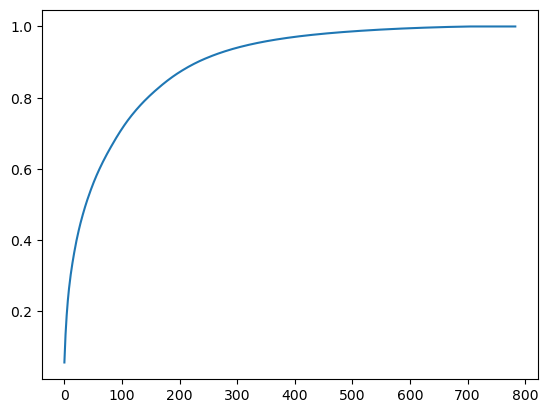

In [66]:
plt.plot(np.cumulative_sum(pca.explained_variance_ratio_))